The following code cell downloads all required files including previously trained checkpoints/results and the dataset.

In [25]:
!pip install -q lightning einops opencv-python gdown pydantic lpips tensorboard matplotlib pandas
!gdown https://drive.google.com/uc?id=1GLAumjyh25JEbau--IbbTMxzYFc_S7jE ## dataset
!gdown --id 1ApjUD3nZKTN-PZukh92EpC4iUjKC0RGi ## test images
!gdown --id 1-FCJs8BRhaWZ8Ns_zpZIJhh8a0qYE0Uq ## checkpoints
!gdown --id 1SlQ6tnrJdkktymC5NfZWt9c4MZeCPCZm ## logs
!unzip -qu animal-faces.zip
!unzip -qu test_images.zip
!unzip -qu checkpoints.zip
!unzip -qu logs.zip
!rm *.zip

Downloading...
From (original): https://drive.google.com/uc?id=1GLAumjyh25JEbau--IbbTMxzYFc_S7jE
From (redirected): https://drive.google.com/uc?id=1GLAumjyh25JEbau--IbbTMxzYFc_S7jE&confirm=t&uuid=a9e30f5e-07c2-4196-88a8-9a858cb69acb
To: /root/ECE324_Jupyter2/ECE324_Jupyter/animal-faces.zip
100%|████████████████████████████████████████| 730M/730M [00:12<00:00, 57.6MB/s]
/opt/conda/lib/python3.10/site-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1ApjUD3nZKTN-PZukh92EpC4iUjKC0RGi
To: /root/ECE324_Jupyter2/ECE324_Jupyter/test_images.zip
100%|████████████████████████████████████████| 303k/303k [00:00<00:00, 10.8MB/s]
/opt/conda/lib/python3.10/site-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymo

## Dataset and Datamodule

The following code cell defines our dataset/datamodule and how we preprocess our data. 

### Preprocessing
We first resize all images to a square image with a parameterized dimension; this is done with opencv. In most instances, this new dimension will be smaller than the original image size, so we utilize the `cv2.INTER_AREA` method which is optimized for downsampling.
We also normalize our dataset to have 0 mean and 1 stdev for each color channel (red, blue, green). We accomplish this with the `normalize` function and the `MEANS` and `STDS` variables, which are the precomputed means and standard deviations of the dataset for each color channel. The `unnormalize` function is also defined to later return our normalized outputs back to normal images.

### Classes
The `AFHQDataset` class is a standard Pytorch dataset used for loading our images. At initialization, it first scans the given dataset folder for all images, which it stores in `self.image_filenames`. This allows the dataset to be indexed without having to load all images into memory. Given an index, it reads the image at the corresponding path and does the preprocessing procedure described earlier.

The `AFHQDataModule` class allows the dataset to be used in Pytorch Lightning, an extension to Pytorch with more features and faster training. For the most part, it serves as a wrapper to the standard Pytorch Dataloader. This is where we define our batch size and the number of CPU cores we will use to speed up the data loading.

In [6]:
from torch.utils.data import DataLoader, IterableDataset, Dataset
import torch
import torchvision.io as io

import numpy as np
import cv2

from pathlib import Path
import lightning.pytorch as pl

import random

MEANS = [0.5022, 0.4599, 0.3994]
STDS = [0.2554, 0.2457, 0.2504]

def normalize(im, tensor=False):
    f = (lambda x: torch.tensor(x).to(im)) if tensor else np.array
    means = f(MEANS)
    stds = f(STDS)
    im -= means[..., None, None]
    im /= stds[..., None, None]
    return im
    
def unnormalize(im, tensor=False):
    f = (lambda x: torch.tensor(x).to(im)) if tensor else np.array
    means = f(MEANS)[..., None, None]
    stds = f(STDS)[..., None, None]

    if im.ndim == 4:
        means = means.unsqueeze(0)
        stds = stds.unsqueeze(0)

    im = im * stds
    im = im + means
    im = im.clamp(0., 1.)
    return im

class AFHQDataset(Dataset):
    def __init__(self, path, im_size=512, use_normalize=True, dtype=None):
        super().__init__()
        self.image_filenames = list(Path(path).glob('**/*.jpg'))
        self.im_size = im_size
        self.normalize = normalize if use_normalize else (lambda x: x)
        self.dtype = np.float32 if dtype is None else dtype
        
    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        return self.normalize(cv2.resize(cv2.imread(str(self.image_filenames[idx].resolve()), cv2.IMREAD_COLOR), (self.im_size, self.im_size), interpolation=cv2.INTER_AREA)[..., ::-1].transpose(-1, 0, 1) / 255).astype(self.dtype)

class AFHQDataModule(pl.LightningDataModule):
    def __init__(self, base_dataset, batch_size, num_workers=1, shuffle=True):
        super().__init__()        
        self.base_dataset = base_dataset
        self.num_workers = num_workers
        self.batch_size = batch_size
        self.shuffle = shuffle
        
    def train_dataloader(self):
        return DataLoader(
            dataset = self.base_dataset,
            batch_size = self.batch_size,
            num_workers = self.num_workers,
            pin_memory = True,
            shuffle = self.shuffle,
            drop_last = True
        )

## Model Definition
The following code cell has the implementations of the models we tried.

The specific architectures of the models are explained in more detail in our report; however, as a general overview, the models contained an autoencoder and a critic/discriminator. The goal of the autoencoder was to learn a bijective mapping of images onto a lower dimensionality latent space (i.e. a function to encode images into latents, and also a function to decode latents into images). Interpolation of images was then done by encoding the images into the latent space, doing linear interpolation, and then decoding the result. The goal of the critic/discriminator was to try and distinguish between interpolated images and images from the dataset, analogously to a Discriminator in a Generative Adversarial Network (GAN). 

The `make_layers` function is a helper that aids in creating stacks of convolutions with ReLU activation and max pools. The code is an extension of the `make_layers` function found [here](https://pytorch.org/vision/main/_modules/torchvision/models/vgg.html). The main additions are that it allows you to create a reversed version of the layers defined in the configuration, thus allowing you to create a decoder which is symmetric to your encoder.
    
The general structure of the autoencoder is described in the `Autoencoder` class; it includes an encoder and a decoder, as well as helper functions for  interpolating images linearly in the latent space using a parameter `alpha`. 

The critic/discriminator is described in the `Critic` class; it is essentially just a wrapper for the model and contains no additional helper functions.

The `GenericAAI` parent class describes the general structure of the models we tried as discussed earlier. It contains the code for initializing the autoencoder and critic/discriminator, and defines the loss function used for the reconstruction loss of the autoencoder (i.e. the loss between the original image and the regenerated image after being passed through the encoder &rarr; decoder). 

It also defines two functions, `forward_autoenc` and `forward_critic`. 

The `forward_autoenc` function will take two batches of images as an input and generate a random interpolation for each pair. It will also calculate the losses of the autoencoder, which will depend on the model type and is thus not implemented. It will then return the loss of the autoencoder, the interpolant, and all other additional variables needed to compute the loss of the critic/discriminator later on. 

The `forward_critic` function will use the interpolant and other outputs given by the autoencoder to compute the loss of the critic/discriminator, which it will then return. 

Since this process differs between the models we tried, the parent class does not implement these functions. 

The `ACAI` and `AEAI` classes have the specific implementations of the autoencoder loss and critic/discriminator loss corresponding to each model. The specifics of these losses is described in more detail in our report. 


In [7]:
import torch.nn as nn
import torch.nn.functional as F
        
import pydantic
from pydantic import BaseModel

import lpips
from einops.layers.torch import Rearrange

norm_dict = {'batch': nn.BatchNorm2d, 'instance': nn.InstanceNorm2d}

def make_layers(cfg, input_shape=(0,0,0), shapes=None, batch_norm: bool = True, invert=False, running=True, config=None):
    
    cur_shape = input_shape
    layers = []
    shapes = shapes or []
    pool_l = nn.MaxPool2d(kernel_size=2, stride=2) if not invert else nn.UpsamplingNearest2d(scale_factor=2)
    cfg = cfg[::1 - 2*invert]

    for i, v in enumerate(cfg[1:]):
        if v == "M":
            layers += [pool_l]
            cur_shape = (cur_shape[0], *[x*2 if invert else x//2 for x in cur_shape[1:]])
        elif str(v).startswith('L'):
            if len(cur_shape) > 1:
                layers += [nn.Flatten()]
                shapes += [cur_shape]
                cur_shape = (reduce(lambda x, y: x*y, cur_shape),)
            layers += [nn.Linear(cur_shape[0], int(v[1:])), nn.ReLU(inplace=True)]
            cur_shape = (int(v[1:]),)
        else:
            if len(cur_shape) == 1:
                next_shape = shapes.pop(-1)
                layers += [nn.Linear(cur_shape[0], reduce(lambda x, y: x*y, next_shape)), nn.Unflatten(-1, next_shape)]
                cur_shape = next_shape
            v = int(v)
            conv2d = nn.Conv2d(cur_shape[0], v, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, norm_dict[config.norm_type](v, track_running_stats=running), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)] 
            cur_shape = (v, *cur_shape[1:])
    if invert:
        layers = layers[:-1] #remove last relu
    return nn.Sequential(*layers), cur_shape, shapes

class Autoencoder(nn.Module):
    def __init__(self, cfg, full_cfg):
        super().__init__()
        self.encoder, out_shape, shapes = make_layers(cfg.autoenc, running=True, input_shape=(3, full_cfg['im_size'], full_cfg['im_size']), config=cfg)
        self.decoder, in_shape, _ = make_layers(cfg.autoenc, invert=True, shapes=shapes, running=True, input_shape=out_shape, config=cfg)
        assert in_shape == (3, full_cfg['im_size'], full_cfg['im_size'])
    def encoder_alpha(self, x, y, alpha=0.):
        if x.ndim == 5:
            return alpha * self.encoder(x.squeeze(dim=1))[:, None] + (1 - alpha) * self.encoder(y.squeeze(dim=1))[:, None]
        x_z, y_z = self.encoder(x), self.encoder(y)
        alpha = alpha[(slice(None, None),) + (None,)*(x_z.ndim - 1)]
        res = alpha * x_z + (1 - alpha) * y_z
        return res
    def forward(self, x, y, alpha=0.):
        return self.decoder(self.encoder_alpha(x, y, alpha))
    
class Critic(nn.Module):
    def __init__(self, cfg, full_cfg):
        super().__init__()
        self.classifier = nn.Sequential(
            make_layers(cfg.critic, input_shape=(3, full_cfg['im_size'], full_cfg['im_size']), config=cfg)[0],
            nn.AdaptiveAvgPool2d((cfg.critic_psize, cfg.critic_psize)),
            nn.Flatten(),
            nn.Linear(int(cfg.critic[-1]) * cfg.critic_psize ** 2, cfg.critic_hidden),
            nn.ReLU(True),
            nn.Dropout(p=cfg.critic_dropout),
            nn.Linear(cfg.critic_hidden, 1),
        )
    
    def forward(self, x):
        return self.classifier(x)

loss_dict = {'mse': nn.MSELoss(), 'l1': nn.L1Loss(), 'alex': lpips.LPIPS(net='alex')}
loss_norm = {'mse': False, 'l1': False, 'alex': True}

class GenericAAI(nn.Module):
    def __init__(self, cfg, full_cfg):
        super().__init__()
        self.autoenc = Autoencoder(cfg, full_cfg)
        self.critic = Critic(cfg, full_cfg)
        self.cfg = cfg
        self.full_cfg = full_cfg
        self.autoenc_criterion = loss_dict.get(self.cfg.autoenc_loss, nn.MSELoss())
        self.autoenc_unnorm = (lambda x: x) if not loss_norm[self.cfg.autoenc_loss] else (lambda x: unnormalize(x, tensor=True) * 2 - 1)

    def forward_autoenc(self, x, y):
        raise NotImplementedError
    
    def forward_critic(self, *args):
        raise NotImplementedError

class ACAI(GenericAAI):
    def __init__(self, cfg, full_cfg):
        super().__init__(cfg, full_cfg)
        self.critic_criterion = loss_dict.get(self.cfg.critic_loss, nn.MSELoss())

    def forward_autoenc(self, x, y):
        bs = x.shape[0]
        x_z, y_z = self.autoenc.encoder(x), self.autoenc.encoder(y)
        alpha = 0.5*torch.rand(bs, dtype=x.dtype, device=x.device)[(slice(None, None),) + (None,)*(x_z.ndim - 1)]
        autoenc_y = self.autoenc.decoder(y_z)
        loss = self.autoenc_criterion(*[self.autoenc_unnorm(z) for z in [autoenc_y, y]]).mean()
        res = self.autoenc.decoder(alpha * x_z + (1 - alpha) * y_z)
        loss += self.cfg.autoenc_lambda * self.critic(res).square().mean()
        return (loss, dict()), y, res, alpha, autoenc_y

    def forward_critic(self, y, res, alpha, autoenc_y):
        loss = self.critic_criterion(self.critic(res.detach()).squeeze(), alpha.squeeze())
        res = self.critic(self.cfg.critic_gamma * y + (1 - self.cfg.critic_gamma) * autoenc_y.detach())#.abs().mean()
        loss += self.critic_criterion(res, torch.zeros_like(res))
        return (loss, dict())
   
from functools import reduce
from einops import rearrange

class AEAI(GenericAAI):
    def __init__(self, cfg, full_cfg):
        super().__init__(cfg, full_cfg)

    def forward_autoenc(self, x, y):
        bs = x.shape[0]
        alpha = torch.rand(bs).to(x) # B

        # RECON LOSS
        autoenc_y = self.autoenc.decoder(self.autoenc.encoder(y))
        autoenc_x = self.autoenc.decoder(self.autoenc.encoder(x))
        recon_loss = reduce(lambda x, y: x + y, [self.autoenc_criterion(*[self.autoenc_unnorm(z) for z in tup]).mean() for tup in zip([autoenc_y, autoenc_x], [y, x])])        
        res_z = self.autoenc.encoder_alpha(x, y, alpha) # B C H W
        res = self.autoenc.decoder(res_z)

        # ADVERSARIAL LOSS
        adv_loss = -self.cfg.autoenc_lambda * F.logsigmoid(self.critic(res)).mean()

        # CYCLE CONSISTENCY
        cycle_loss = self.cfg.cycle_lambda * (self.autoenc.encoder(res) - res_z).square().mean()
        loss = recon_loss + adv_loss + cycle_loss
        return (loss, {'recon':recon_loss, 'adv':adv_loss, 'cycle':cycle_loss}), res, alpha, x, y

    def forward_critic(self, res, alpha, x, y):
        res = res.detach()
        res.requires_grad_()
        negative_samples = self.critic(res).squeeze()
        positive_samples = self.critic(torch.cat([x, y], axis=0)).squeeze()

        predictions = torch.cat([negative_samples, positive_samples], axis=0)
        targets = torch.cat([torch.zeros_like(negative_samples), torch.ones_like(positive_samples)], axis=0)
        loss = F.binary_cross_entropy_with_logits(predictions, targets)

        return loss, dict()

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:05<00:00, 41.1MB/s] 


Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth


## Model Training

The following cell describes the rough training loop of the model. It also contains the configuration of the model and its associated optimizers.

We wanted to make the model as customizable as possible, which necessitated a large configuration. To aid with this, we utilized `pydantic`, which allows for the creation of strictly typed structures; this helps determine what data type each value should be, and also allows us to constrain parameters to a certain domain. `LitModelCfg` is the class which contains this configuration; the details of each value are described in the comments.

`LitModel` contains our model and its associated optimizers.

The `configure_optimizers` function initializes and defines our optimizers. Since we are essentially training two models simultaneously, we need two separate optimizers for the autoencoder and the critic. 

The `training_step` function contains the code for backpropagating the loss and computing the update to the parameters using the optimizers. It also contains some modifications to the training procedure that help improve the model; one of these is weight clipping, which clamps the critic's weights so that it is always within a small range. This technique was introduced in the [Wasserstein GAN paper](https://arxiv.org/abs/1701.07875) and helps enforce the smoothness of the critic function. It also logs the loss to the progress bar and a csv file, and periodically visualizes the interpolations of the model using the `_visualize_results` helper function.


In [50]:
import lightning.pytorch as pl
import torch
import torch.nn as nn
import torch.nn.functional as F

import pydantic
from pydantic import BaseModel

from typing import List, Union, Optional, Literal
from torchvision.utils import make_grid
import torchvision.transforms as T
to_image = T.ToPILImage()

from PIL import Image, ImageDraw, ImageFont
from matplotlib import font_manager

default_font = font_manager.FontProperties(family='sans-serif', weight='bold')
default_fonts = {size: ImageFont.truetype(font_manager.findfont(default_font), size) for size in [8] + list(range(10, 35, 5))}

model_dict = {'acai': ACAI, 'aeai': AEAI}
optimizer_dict = {'adam': torch.optim.Adam, 'radam': torch.optim.RAdam, 'rmsprop': torch.optim.RMSprop}

class LitModelCfg(BaseModel):
    
    ##### TRAINING PARAMS ####

    optimizer : Literal["radam", "adam", "rmsprop"] = "radam" # the default type of optimizer used 
    autoenc_optimizer : Optional[Literal["radam", "adam", "rmsprop"]] = None # optimizer used for the autoencoder; overwrites the default optimizer if not None
    critic_optimizer : Optional[Literal["radam", "adam", "rmsprop"]] = "rmsprop" # optimizer used for the critic; overwrites the default optimizer if not None

    lr_autoenc : float = 2e-4 # learning rate of the autoencoder's optimizer
    lr_critic : float = 1e-4 # learning rate of the critic's optimizer

    ##### ARCHITECTURE ####
    
    architecture : Literal["aeai", "acai"] = 'aeai' # type of model
    
    autoenc: List[Union[str, int]] = [
        3,
        64,
        "M",
        128,
        "M",
        256,
        256,
        "M",
        256,
        256,
        "M",
        256,
        256,
        "M",
        256
    ] # definition of both encoder and decoder capable of being processed by the `make_layers` function; only one specification is needed since they are symmetric
    autoenc_lambda : float = 0.1 # weight of critic loss in the total autoencoder loss
    cycle_lambda : float = 3e-2 # weight of cycle loss in the autoencoder loss; used only by the AEAI model 
    autoenc_loss : Literal["alex", "mse"] = 'alex' # type of loss function used for the reconstruction loss of the autoencoder

    critic: List[Union[str, int]] = [
        3,
        64,
        "M",
        128,
        "M",
        256,
        256,
        "M",
        256,
        "M",
        256
    ] # definition of critic model capable of being processed by the `make_layers` function
    critic_dropout : float = 0. # dropout percentage to be used in critic model
    critic_psize : int = 3 # size that average pooling in the critic should pool to
    critic_hidden : int = 1024 # hidden layer dimension in critic
    critic_gamma : float = 0.2 # amount of real image used in critic; only used for ACAI model
    critic_loss : str = 'mse' # critic loss function; only used for ACAI model
    wclamp : Optional[float] = 0.01 # weight clamping bounds; if not None, then critic weights are clamped between [-wclamp, wclamp] after every optimizer step
    
    norm_type : Literal["instance", "batch"] = 'batch' # normalization type used in between convolutional layers
    
    ##### VISUALIZATION #######
    visualize_n_batches : int = 1 # number of batches to visualize
    check_samples_every_n_epochs : int = 1 # number of epochs to wait to generate another visualization
    visualize_n_samples : int = 5 # number of alpha samples to use in visualization 

def label_grid(image_grid, title=None, y_top=0, true_alpha=None):
    if title is not None:
        f = default_fonts[15]
        y_top += f.getbbox(title)[-1] + 4

    fontsize = 10
    ff = default_fonts[fontsize]
    y_top += ff.getbbox('alpha')[-1] + 4
        
    layer = Image.new('RGB', (image_grid.size[0], image_grid.size[1]+y_top), (255,255,255))
    layer.paste(image_grid, box=(0, y_top))
    text = ['Real image'] + [f'alpha = {alpha}' for alpha in true_alpha] + ['Real image']

    edit = ImageDraw.Draw(layer)
    [edit.text(
        (2 + 130*i + (128 - ff.getlength(t))/2, y_top - ff.getbbox(t)[-1] - 2),  # Coordinates
        t,  # Text
        (0, 0, 0),  # Color
        font = ff
    ) for i, t in enumerate(text)]

    if title is not None:
        edit.text(
            ((image_grid.size[0] - f.getlength(title))/2, 2),
            title,
            (0, 0, 0),
            font = f
        )
    return layer

class LitModel(pl.LightningModule):
    def __init__(self, config):
        super().__init__()
        self.save_hyperparameters()
        
        self.full_config = config
        self.config = LitModelCfg.parse_obj(config)
        self.model = model_dict[self.config.architecture](self.config, self.full_config)
        self.accumulated_loss = dict()    
        self.accumulated_loss_counter = 0    
    
        self.automatic_optimization = False
    
    def configure_optimizers(self):
        cfg = self.config
        autoenc_opt = optimizer_dict[cfg.autoenc_optimizer or cfg.optimizer](self.model.autoenc.parameters(), lr=cfg.lr_autoenc)
        critic_opt = optimizer_dict[cfg.critic_optimizer or cfg.optimizer](self.model.critic.parameters(), lr=cfg.lr_critic)
        return autoenc_opt, critic_opt
    
    def training_step(self, batch, batch_idx):

        a_opt, c_opt = self.optimizers()
        x_b, y_b = torch.tensor_split(batch, 2)

        (loss, loss_components), *args = self.model.forward_autoenc(x_b, y_b)
        a_opt.zero_grad()
        self.manual_backward(loss)
        a_opt.step()

        c_loss, c_loss_components = self.model.forward_critic(*args)
        c_opt.zero_grad()
        self.manual_backward(c_loss)
        c_opt.step()
        
        if self.config.wclamp != None:
            for p in self.model.critic.parameters():
                p.data.clamp_(-self.config.wclamp, self.config.wclamp)

        loss_dict = {"autoenc_loss": loss, "critic_loss": c_loss}
        self.log_dict(loss_dict, prog_bar=True)
        for k, v in loss_dict.items():
            self.accumulated_loss[k] = self.accumulated_loss.get(k, 0) + v
            self.accumulated_loss_counter += 1
        
        if len(loss_components):
            self.log_dict({f'{k}_loss': v for k, v in loss_components.items()}, prog_bar=True)
        if len(c_loss_components):
            self.log_dict({f'{k}_loss': v for k, v in c_loss_components.items()}, prog_bar=True)
            
        if ((self.current_epoch + 1) % self.config.check_samples_every_n_epochs == 0) and (batch_idx < self.config.visualize_n_batches):
            self._visualize_results(x_b, y_b, title=f'Epoch {self.current_epoch}', show=True)

    @torch.no_grad()
    def _visualize_results(self, x_b, y_b, y_top=0, title=None, show=False):
        N = self.config.visualize_n_samples
        samples = x_b[[0]], y_b[[0]]
        true_alpha = torch.linspace(1, 0, N).to(x_b)
        results = self.model.autoenc(*[x.repeat(N, 1, 1, 1) for x in samples], true_alpha)
        results_log = torch.cat([samples[0], results, samples[1]], axis=0)
        image_grid = to_image(make_grid([unnormalize(x, tensor=True) for x in [samples[0][0]] + list(results.unbind(dim=0)) + [samples[1][0]]], nrow=N + 2))
        labelled = label_grid(image_grid, y_top=y_top, title=title, true_alpha=true_alpha)
        if show:
            labelled.show()
        return labelled
        
    def on_train_epoch_end(self):
        
        print('{:#^40}'.format(f' Epoch {self.current_epoch + 1} '))
        print('\n'.join(f'Average {k} for epoch {self.current_epoch + 1} = {v / self.accumulated_loss_counter}' for k, v in self.accumulated_loss.items()))
        
        self.accumulated_loss = dict()
        self.accumulated_loss_counter = 0
        

## Model Training (cont.)
The following cell sets up the dataloader and contains other configuration details the Pytorch Lightning trainer requires. Similar to the model configuration, this configuration is also stored in a `pydantic` class, which inherits the `LitModelCfg` class so it also contains all previously defined configuration details. 

The `train` function creates and trains a model with the configuration given. Using the configuration, it sets up the checkpoint and logging callbacks, the dataloader, the model, and the Pytorch Lightning trainer. This trainer defines some of the other configurations of the training process, like the compute used in the training procedure (gpu or cpu), the number of epochs we want to train for, and the floating point precision used in the training process. It then checks if a checkpoint already exists in the checkpoint directory specified in the configuration; if so, it loads it so that training can continue from the last checkpoint. It then trains the model using the Pytorch Lightning trainer. 

In [42]:
from lightning.pytorch.callbacks import LearningRateMonitor, ModelCheckpoint, ModelSummary, EarlyStopping
from lightning.pytorch.loggers import TensorBoardLogger, CSVLogger
import lightning.pytorch as pl

import torch
torch.set_float32_matmul_precision('medium')
from typing import List, Optional

import pathlib
from pathlib import Path
from pydantic import BaseModel, Field

import uuid
import datetime
from datetime import timedelta
import json
from collections import defaultdict
import numpy as np
from lightning.pytorch.tuner import Tuner
from lightning.pytorch.accelerators import find_usable_cuda_devices

# torch precision to numpy precision
dtype_dict = defaultdict(lambda : None, {'16-mixed': np.float16})

### TRAINING CONFIGURATION ###
class TrainConfig(LitModelCfg):

    ###### GENERAL TRAINING ##########

    seed: int = 42 # seed used for all modules with randomness 
    accelerator: Literal["gpu", "cpu"] = "gpu" # type of compute used for training
    devices : int = 1 # number of compute devices to use
    max_epochs : int = 10 # maximum number of epochs to train for
    auto_batch_size : bool = False # if true, automatically scale batch size until memory runs out

    precision : Optional[str] = '16-mixed' # floating point precision used

    ####### DATAMODULE CONFIG ##########
    data_folder : str = 'afhq/train' # data folder
    batch_size : int = 32 # batch size
    num_workers : int = 8 # number of workers used in loading data

    im_size : int = 128 # image size to scale down to in preprocessing
    normalize : bool = True # if true, normalize the image in preprocessing

    ######## LOGGING ##########
    progress_bar: bool = True # if true, display a progress bar when training
    log_every_n_steps: int = 10 # number of optimizer steps before logging (useful for reducing disk usage of logs)

    checkpoint : bool = True # if true, save checkpoints
    checkpoint_dir: Optional[str] = "checkpoints/aeai_test" # folder to save/load checkpoints from
    checkpoint_every_n_epochs : int = 10 # number of epochs before saving checkpoint

    project_name : str = "aeai_test" # project name used in logs
    log_dir : str = "logs" # folder to save logs

    ##### DEBUG ######
    debug_single : bool = False # if true, debug with debug_num training samples
    debug_num : int = 1 # number of samples to debug with if debug_single is true

def train(cfg):
    # seed all modules so results are replicable
    pl.seed_everything(cfg.seed, workers=True)

    #### setup checkpoint and logging directory
    if cfg.checkpoint_dir is None:  # set to some random unique folder
        rand_dir = pathlib.Path(__file__).parents[0] / "checkpoints" / str(uuid.uuid4())
        assert not rand_dir.exists()
        cfg.checkpoint_dir = str(rand_dir)
        
    ckpt_dir = pathlib.Path(cfg.checkpoint_dir)
    ckpt_dir.mkdir(parents=True, exist_ok=True)
    ckpt_dir = ckpt_dir.resolve()

    log_dir = pathlib.Path(cfg.log_dir)
    log_dir.mkdir(parents=True, exist_ok=True)
    log_dir = log_dir.resolve()

    #### setup dataset and dataloader
    base_dataset = AFHQDataset(
        cfg.data_folder,
        im_size = cfg.im_size,
        use_normalize = cfg.normalize,
        dtype = dtype_dict[cfg.precision]
    )

    datamodule = AFHQDataModule(
        base_dataset, 
        batch_size=cfg.batch_size,
        num_workers=cfg.num_workers,
        shuffle = not cfg.debug_single
    )

    #### create model with configuration
    #### converted cfg to dict so that model parameters can be pickled
    model = LitModel(config=dict(cfg))

    # print summary of model before training
    callbacks = [ModelSummary(max_depth=2)] 

    # checkpoint model regularly; also save models with best autoenc loss
    if cfg.checkpoint:
        ckpt_callbacks = [
            ModelCheckpoint(
                dirpath=ckpt_dir,
                save_last=True,
                verbose=True,
                every_n_epochs=cfg.checkpoint_every_n_epochs
            ),
        ]
        callbacks.extend(ckpt_callbacks)

    # setup logging
    logger = CSVLogger(log_dir, name=cfg.project_name)
    
    # setup trainer with config
    trainer = pl.Trainer(
        accelerator=cfg.accelerator,
        devices=cfg.devices,
        callbacks=callbacks,
        enable_checkpointing=cfg.checkpoint,
        logger=logger,
        max_epochs=cfg.max_epochs,
        log_every_n_steps=cfg.log_every_n_steps,
        enable_progress_bar=cfg.progress_bar,
        num_sanity_val_steps=0,
        use_distributed_sampler=False,
        limit_train_batches = cfg.debug_num if cfg.debug_single else None,
        limit_val_batches = 0,
        precision=cfg.precision
    )

    tuner = Tuner(trainer)
    if cfg.auto_batch_size:
        tuner.scale_batch_size(model, datamodule=datamodule, mode="power")

    ckpt_path = ckpt_dir / "last.ckpt"
    ckpt_path = str(ckpt_path) if ckpt_path.exists() else None
    trainer.fit(model=model, datamodule=datamodule, ckpt_path=ckpt_path)

    return 0

## Training (AEAI)

The following cell runs the training procedure on the AEAI model with 10 epochs as a demonstration of the training process. The actual training process of the models was done with cloud compute as the models needed hundreds of epochs to produce reasonable results, and so it is not possible to produce the results live. 

Seed set to 42
Using 16bit Automatic Mixed Precision (AMP)
Trainer already configured with model summary callbacks: [<class 'lightning.pytorch.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                    | Type        | Params
--------------------------------------------------------
0 | model                   | AEAI        | 14.8 M
1 | model.autoenc           | Autoencoder | 7.8 M 
2 | model.critic            | Critic      | 4.5 M 
3 | model.autoenc_criterion | LPIPS       | 2.5 M 
--------------------------------------------------------
12.3 M    Trainable params
2.5 M     Non-trainable params
14.8 M    Total params
59.222    Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

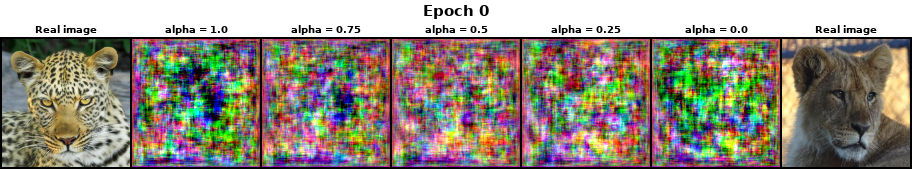

############### Epoch 1 ################
Average autoenc_loss for epoch 1 = 0.45441287755966187
Average critic_loss for epoch 1 = 0.22177043557167053


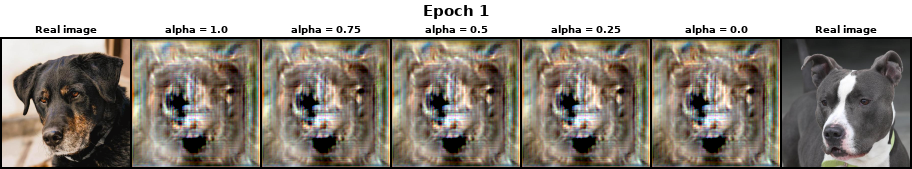

############### Epoch 2 ################
Average autoenc_loss for epoch 2 = 0.3002474308013916
Average critic_loss for epoch 2 = 0.17845982313156128


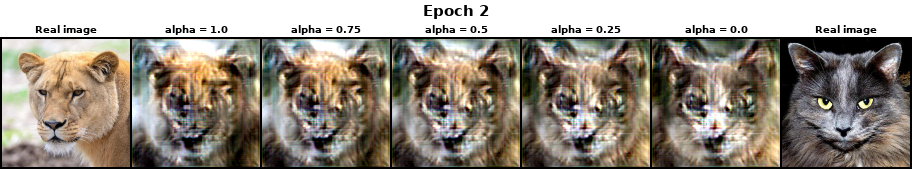

############### Epoch 3 ################
Average autoenc_loss for epoch 3 = 0.25692614912986755
Average critic_loss for epoch 3 = 0.17517240345478058


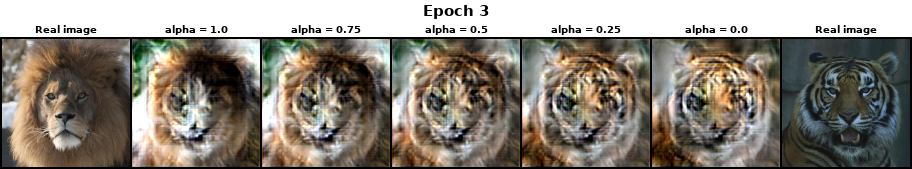

############### Epoch 4 ################
Average autoenc_loss for epoch 4 = 0.23064683377742767
Average critic_loss for epoch 4 = 0.17267954349517822


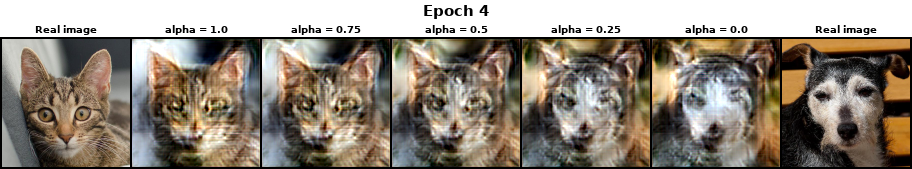

############### Epoch 5 ################
Average autoenc_loss for epoch 5 = 0.2126256823539734
Average critic_loss for epoch 5 = 0.17195825278759003


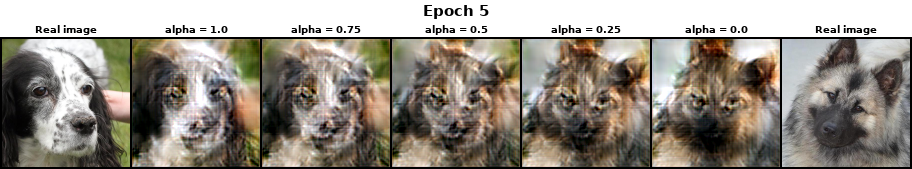

############### Epoch 6 ################
Average autoenc_loss for epoch 6 = 0.1992664635181427
Average critic_loss for epoch 6 = 0.1709551215171814


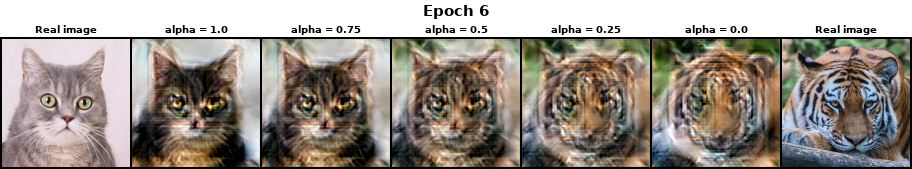

############### Epoch 7 ################
Average autoenc_loss for epoch 7 = 0.18905773758888245
Average critic_loss for epoch 7 = 0.1705339103937149


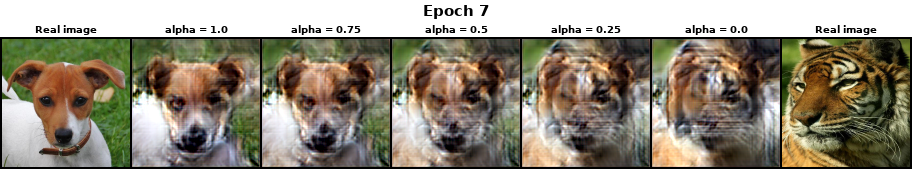

############### Epoch 8 ################
Average autoenc_loss for epoch 8 = 0.18071286380290985
Average critic_loss for epoch 8 = 0.169985830783844


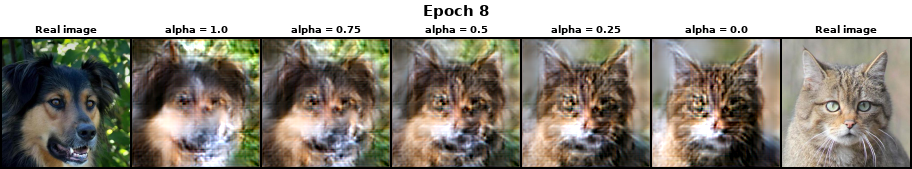

############### Epoch 9 ################
Average autoenc_loss for epoch 9 = 0.17357014119625092
Average critic_loss for epoch 9 = 0.16956660151481628


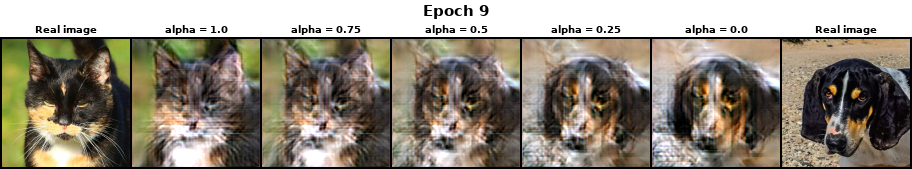

############### Epoch 10 ###############
Average autoenc_loss for epoch 10 = 0.1674196720123291
Average critic_loss for epoch 10 = 0.1688959300518036


`Trainer.fit` stopped: `max_epochs=10` reached.


0

In [51]:
cfg = TrainConfig()
train(cfg)

## Training (ACAI test)

This cell runs the training procedure on the ACAI model with 10 epochs as a demonstration of the training process, similar to the last cell. 

Seed set to 42
Using 16bit Automatic Mixed Precision (AMP)
Trainer already configured with model summary callbacks: [<class 'lightning.pytorch.callbacks.model_summary.ModelSummary'>]. Skipping setting a default `ModelSummary` callback.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name                    | Type        | Params
--------------------------------------------------------
0 | model                   | ACAI        | 23.8 M
1 | model.autoenc           | Autoencoder | 16.8 M
2 | model.critic            | Critic      | 4.5 M 
3 | model.autoenc_criterion | LPIPS       | 2.5 M 
4 | model.critic_criterion  | MSELoss     | 0     
--------------------------------------------------------
21.3 M    Trainable params
2.5 M     Non-trainable params
23.8 M    Total params
95.159    Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

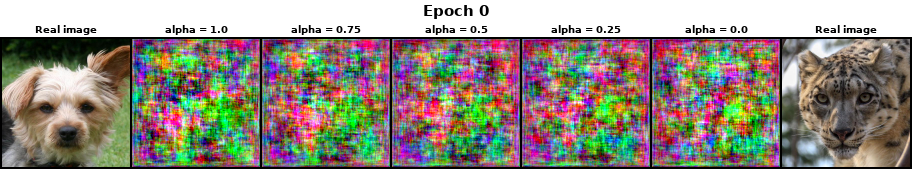

############### Epoch 1 ################
Average autoenc_loss for epoch 1 = 0.357421875
Average critic_loss for epoch 1 = 0.5147201418876648


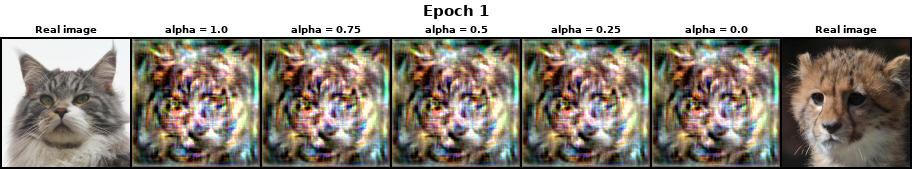

############### Epoch 2 ################
Average autoenc_loss for epoch 2 = 0.166015625
Average critic_loss for epoch 2 = 0.025072960183024406


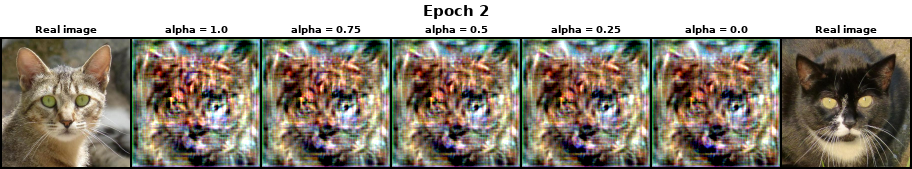

############### Epoch 3 ################
Average autoenc_loss for epoch 3 = 0.1568603515625
Average critic_loss for epoch 3 = 0.024753211066126823


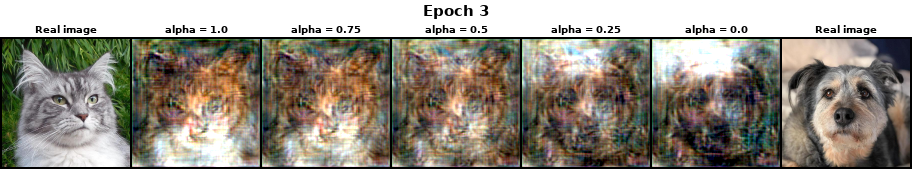

############### Epoch 4 ################
Average autoenc_loss for epoch 4 = 0.1527099609375
Average critic_loss for epoch 4 = 0.024102261289954185


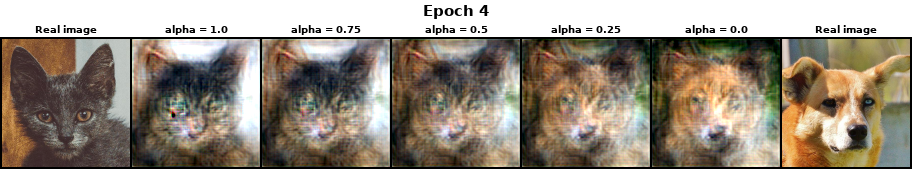

############### Epoch 5 ################
Average autoenc_loss for epoch 5 = 0.149169921875
Average critic_loss for epoch 5 = 0.02310413308441639


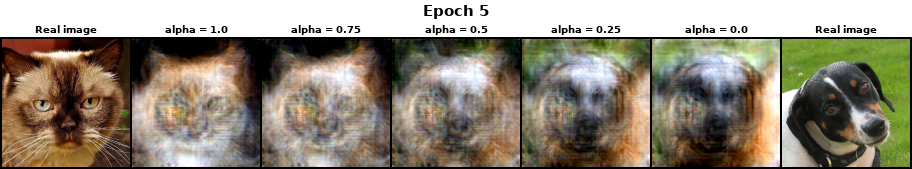

############### Epoch 6 ################
Average autoenc_loss for epoch 6 = 0.14892578125
Average critic_loss for epoch 6 = 0.02420653961598873


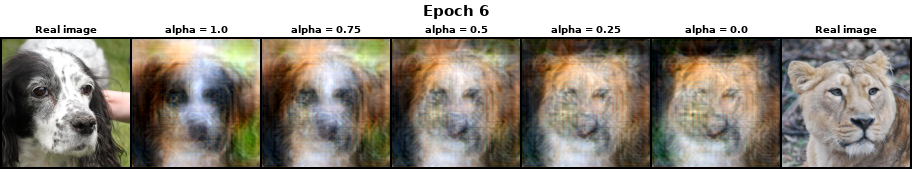

############### Epoch 7 ################
Average autoenc_loss for epoch 7 = 0.1378173828125
Average critic_loss for epoch 7 = 0.02440527267754078


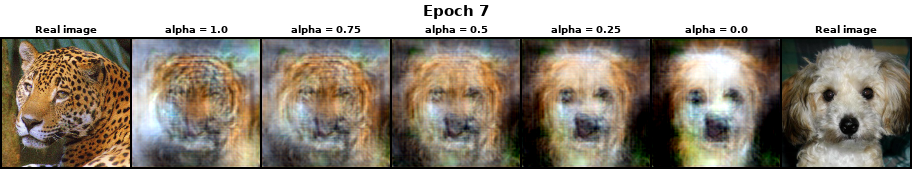

############### Epoch 8 ################
Average autoenc_loss for epoch 8 = 0.1326904296875
Average critic_loss for epoch 8 = 0.025072049349546432


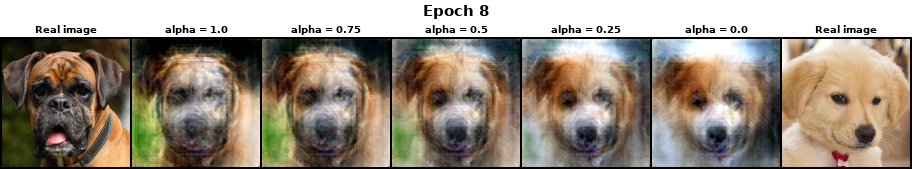

############### Epoch 9 ################
Average autoenc_loss for epoch 9 = 0.1259765625
Average critic_loss for epoch 9 = 0.025751110166311264


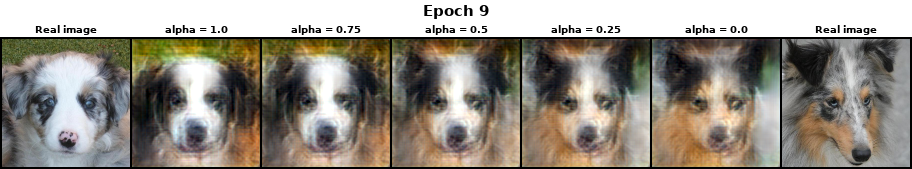

############### Epoch 10 ###############
Average autoenc_loss for epoch 10 = 0.12261962890625
Average critic_loss for epoch 10 = 0.02512718364596367


`Trainer.fit` stopped: `max_epochs=10` reached.


0

In [52]:
cfg = TrainConfig(architecture='acai', 
               autoenc_lambda=0.5, 
               checkpoint_dir="checkpoints/acai_test", 
               autoenc=[
                        3,
                        64,
                        "M",
                        128,
                        "M",
                        256,
                        256,
                        "M",
                        256,
                        256,
                        "M",
                        256,
                        256,
                        "M",
                        256,
                        "L1024"], 
               project_name='acai_test', 
               wclamp=None
 )

train(cfg)

## Generating Results (AEAI Test Run)
The following cell visualizes the loss curves for the AEAI test run above. This includes a loss curve of the critic compared with the adversarial component of the autoencoder loss, as well as a loss curve of the autoencoder split into its various components.

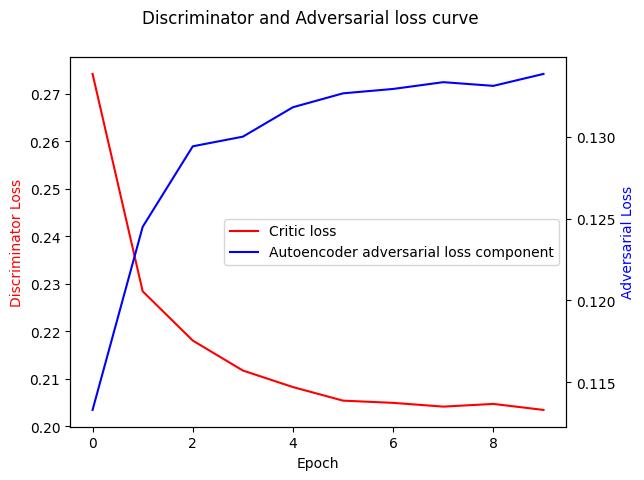

<Figure size 640x480 with 0 Axes>

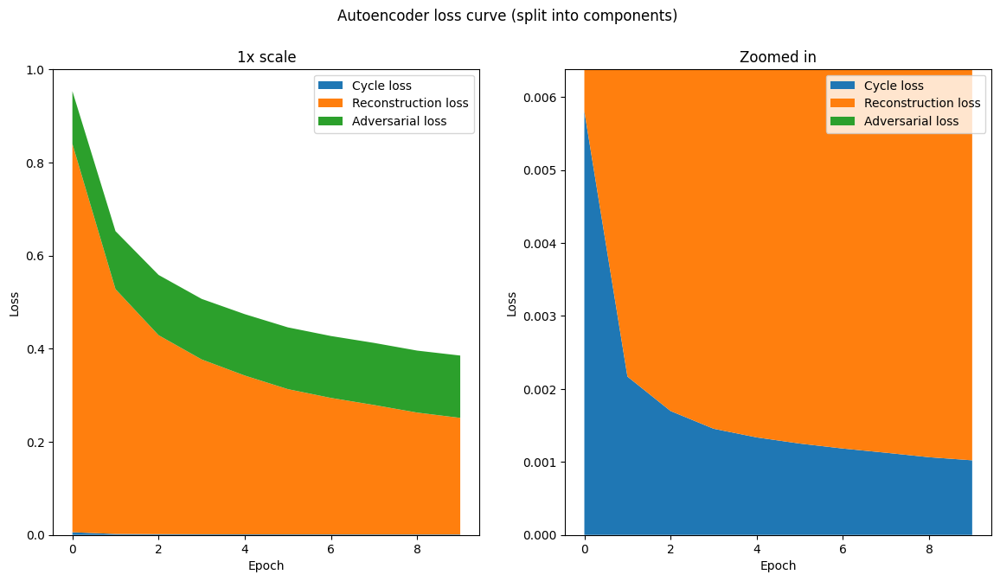

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv('logs/aeai_test/version_0/metrics.csv')
df_mean = df.groupby('epoch').mean()

# plt.plot(df['step'], df['autoenc_loss'])
ax = plt.gca()
ax2 = ax.twinx()
ax.plot(df_mean['critic_loss'], 'r-', label='Critic loss')
ax.plot([], [], '-b', label = 'Autoencoder adversarial loss component')
ax2.plot(df_mean['adv_loss'], 'b-', label='Adversarial loss component')
ax.legend(loc='center right')
ax.set_xlabel('Epoch')
ax.set_ylabel('Discriminator Loss', color='r')
ax2.set_ylabel('Adversarial Loss', color='b')
plt.gcf().suptitle('Discriminator and Adversarial loss curve')
plt.show()
plt.clf()

fig, axs = plt.subplots(1, 2, figsize=(14, 7))

axs[0].stackplot(range(len(df_mean)), df_mean['cycle_loss'], df_mean['recon_loss'], df_mean['adv_loss'],  baseline='zero', labels=('Cycle loss','Reconstruction loss', 'Adversarial loss',));
axs[1].stackplot(range(len(df_mean)), df_mean['cycle_loss'], df_mean['recon_loss'], df_mean['adv_loss'], baseline='zero', labels=('Cycle loss', 'Reconstruction loss', 'Adversarial loss',));
for i in range(2):
    axs[i].legend()
    axs[i].set_xlabel('Epoch')
    axs[i].set_ylabel('Loss')
axs[0].set_title('1x scale');
axs[1].set_title('Zoomed in');
axs[1].set_ylim([0, 1.1*df_mean['cycle_loss'].max()])

fig.suptitle('Autoencoder loss curve (split into components)')

plt.show();

## Generating Results (AEAI Real Run)
The following cell generates the same loss curves as seen above but using the logs from the actual training process of the model we ended up using. These curves span hundreds of epochs and thus require some smoothing to be visually understandable; we accomplish this with an exponential moving average with cutoff window.

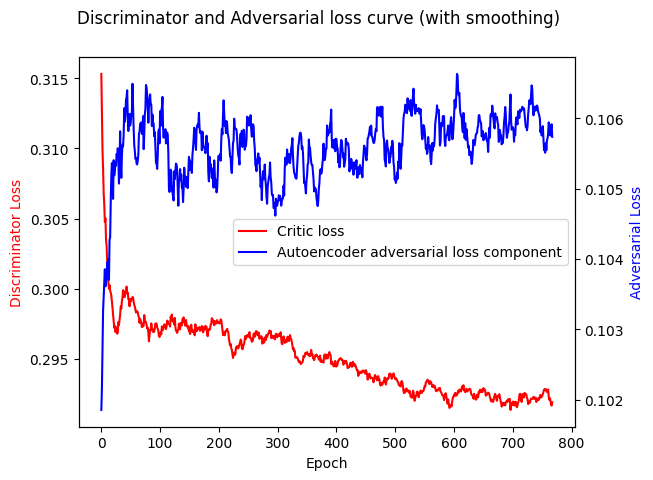

<Figure size 640x480 with 0 Axes>

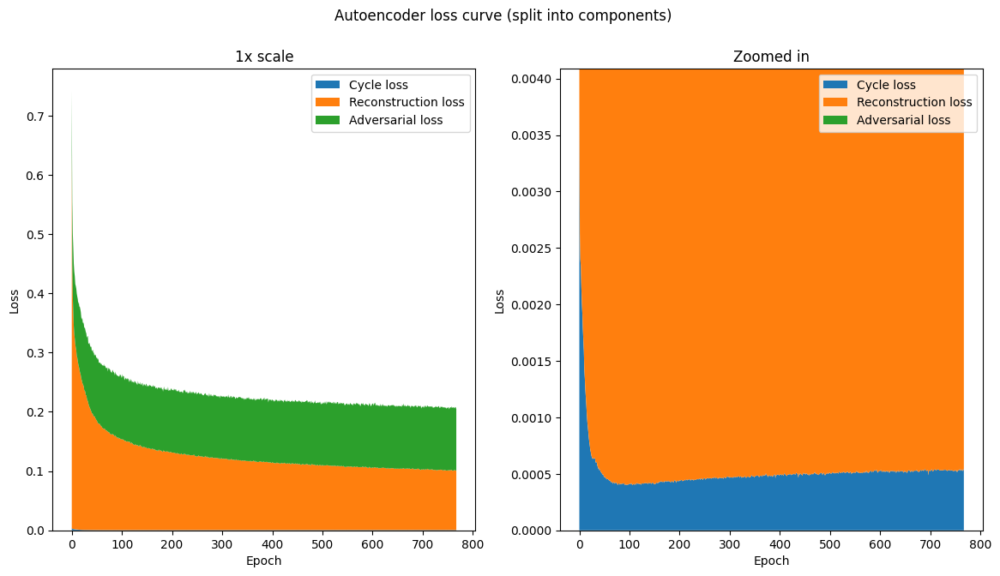

In [145]:
import pandas as pd
import matplotlib.pyplot as plt

results_dir = pathlib.Path('results')
results_dir.mkdir(exist_ok=True, parents=True)

df = pd.read_csv('logs/aeai_final.csv')
df_mean = df.groupby('epoch').mean()

# plt.plot(df['step'], df['autoenc_loss'])
ax = plt.gca()
ax2 = ax.twinx()

def ema(vals, base=0.9):
    N = (np.log(0.01)//np.log(base)).astype(int) + 1
    weights = base ** np.arange(N)
    weights /= weights.sum()
    vals_c = np.concatenate([np.ones_like(vals[:N]) * vals[0], vals], axis=0)
    return np.convolve(vals_c, weights, 'valid')[-vals.shape[0]:]

ax.plot(ema(df_mean['critic_loss']), 'r-', label='Critic loss')
ax.plot([], [], '-b', label = 'Autoencoder adversarial loss component')
ax2.plot(ema(df_mean['adv_loss']), 'b-', label='Autoencoder adversarial loss component')
ax.legend(loc='center right')
ax.set_xlabel('Epoch')
ax.set_ylabel('Discriminator Loss', color='r')
ax2.set_ylabel('Adversarial Loss', color='b')
plt.gcf().suptitle('Discriminator and Adversarial loss curve (with smoothing)')
plt.savefig(results_dir / 'aeai_crit_loss.png')
plt.show()
plt.clf()

fig, axs = plt.subplots(1, 2, figsize=(14, 7))

axs[0].stackplot(range(len(df_mean)), df_mean['cycle_loss'], df_mean['recon_loss'], df_mean['adv_loss'],  baseline='zero', labels=('Cycle loss','Reconstruction loss', 'Adversarial loss',));
axs[1].stackplot(range(len(df_mean)), df_mean['cycle_loss'], df_mean['recon_loss'], df_mean['adv_loss'], baseline='zero', labels=('Cycle loss', 'Reconstruction loss', 'Adversarial loss',));
for i in range(2):
    axs[i].legend()
    axs[i].set_xlabel('Epoch')
    axs[i].set_ylabel('Loss')
axs[0].set_title('1x scale');
axs[1].set_title('Zoomed in');
axs[1].set_ylim([0, 1.1*df_mean['cycle_loss'].max()])

fig.suptitle('Autoencoder loss curve (split into components)')
plt.savefig(results_dir / 'aeai_autoenc_loss.png')

plt.show();

## Generating Results (ACAI Test Run)
The following cell visualizes the loss curves for the ACAI test run above. This is just an the loss curve of the autoencoder compared with the loss curve of the critic.

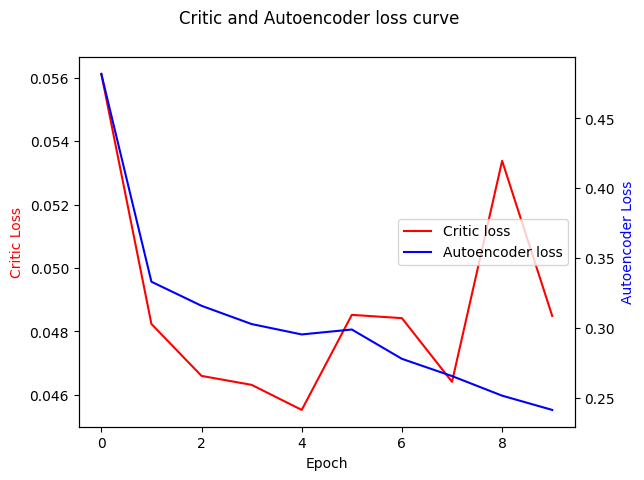

<Figure size 640x480 with 0 Axes>

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv('logs/acai_test/version_0/metrics.csv')
df_mean = df.groupby('epoch').mean()

# plt.plot(df['step'], df['autoenc_loss'])
ax = plt.gca()
ax2 = ax.twinx()
ax.plot(df_mean['critic_loss'], 'r-', label='Critic loss')
ax.plot([], [], '-b', label = 'Autoencoder loss')
ax2.plot(df_mean['autoenc_loss'], 'b-', label='Autoencoder loss')
ax.legend(loc='center right')
ax.set_xlabel('Epoch')
ax.set_ylabel('Critic Loss', color='r')
ax2.set_ylabel('Autoencoder Loss', color='b')
plt.gcf().suptitle('Critic and Autoencoder loss curve')
plt.show()
plt.clf()

## Generating Results (ACAI Real Run)
The following cell visualizes the same loss curves as above but for the real ACAI run.

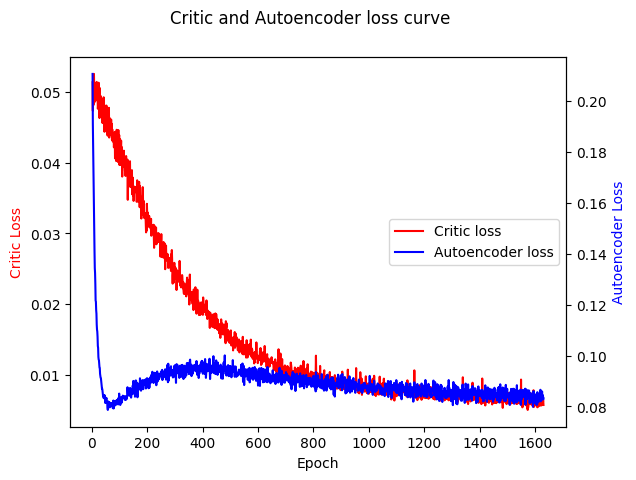

<Figure size 640x480 with 0 Axes>

In [44]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv('logs/acai_final.csv')
df_mean = df.groupby('epoch').mean()

results_dir = pathlib.Path('results')
results_dir.mkdir(exist_ok=True, parents=True)

# plt.plot(df['step'], df['autoenc_loss'])
ax = plt.gca()
ax2 = ax.twinx()
ax.plot(df_mean['critic_loss'], 'r-', label='Critic loss')
ax.plot([], [], '-b', label = 'Autoencoder loss')
ax2.plot(df_mean['autoenc_loss'], 'b-', label='Autoencoder loss')
ax.legend(loc='center right')
ax.set_xlabel('Epoch')
ax.set_ylabel('Critic Loss', color='r')
ax2.set_ylabel('Autoencoder Loss', color='b')
plt.gcf().suptitle('Critic and Autoencoder loss curve')
plt.savefig(results_dir / 'acai_loss_curve.png')
plt.show()
plt.clf()

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
df = pd.read_csv('logs/acai_test/version_0/metrics.csv')
df_mean = df.groupby('epoch').mean()

# plt.plot(df['step'], df['autoenc_loss'])
ax = plt.gca()
ax2 = ax.twinx()
ax.plot(df_mean['critic_loss'], 'r-', label='Critic loss')
ax.plot([], [], '-b', label = 'Autoencoder loss')
ax2.plot(df_mean['autoenc_loss'], 'b-', label='Autoencoder loss')
ax.legend(loc='center right')
ax.set_xlabel('Epoch')
ax.set_ylabel('Critic Loss', color='r')
ax2.set_ylabel('Autoencoder Loss', color='b')
plt.gcf().suptitle('Critic and Autoencoder loss curve')
plt.show()
plt.clf()

## Generating Test Results
The following cell loads trained models from checkpoints in order to compare their interpolation results with some hand selected images. We also compare them against direct interpolation in image space, which is also known as a crossfade. The visualization is mainly done with the `_visualize_results` function defined earlier, along with some additional helper functions. The test images are loaded using the `AFHQDataset` defined earlier and the pytorch `DataLoader`.

GOOD SAMPLES


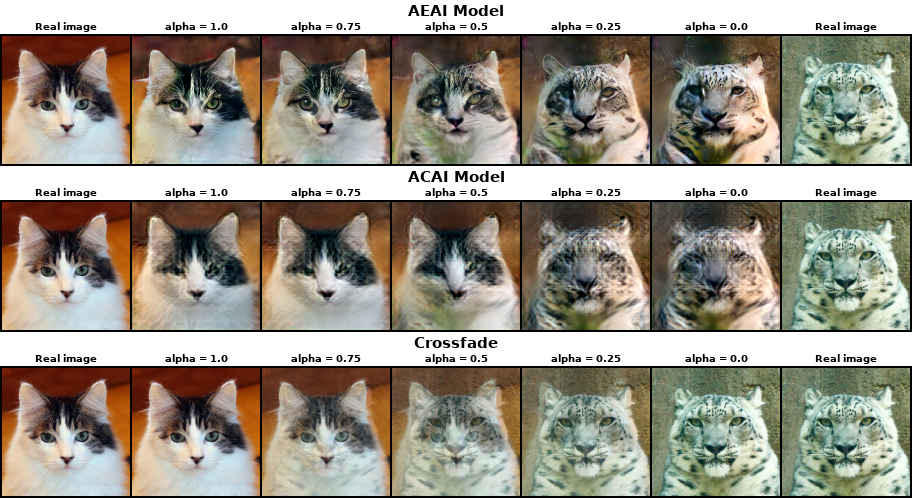

BAD SAMPLES


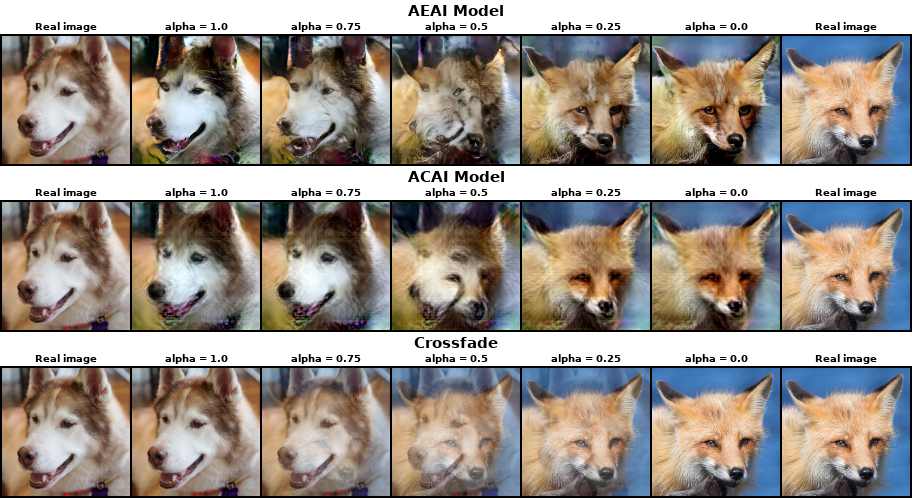

POSE INTERPOLATION SAMPLES


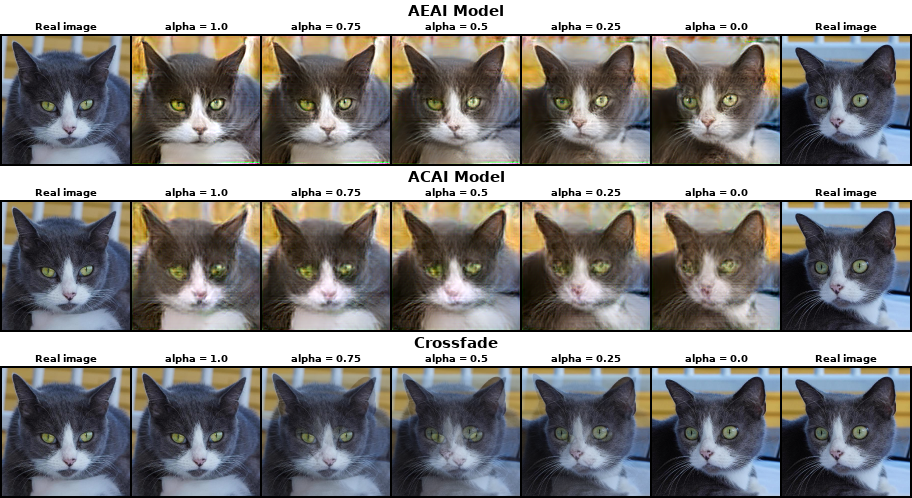

In [13]:
import torchvision.transforms as T
to_image = T.ToPILImage()

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = LitModel.load_from_checkpoint('checkpoints/aeai.ckpt') #trained for 766 epochs
model_acai = LitModel.load_from_checkpoint('checkpoints/acai.ckpt') #trained for 1630 epochs
model.to(device)
model_acai.to(device)

good_dataset = AFHQDataset('test_images/interp', im_size=128, use_normalize=True)
good_dataloader = DataLoader(
    dataset = good_dataset,
    batch_size = 2,
    num_workers = 1,
    pin_memory = True,
    shuffle = False,
    drop_last = True
)

bad_dataset = AFHQDataset('test_images/bad', im_size=128, use_normalize=True)
bad_dataloader = DataLoader(
    dataset = bad_dataset,
    batch_size = 2,
    num_workers = 1,
    pin_memory = True,
    shuffle = False,
    drop_last = True
)

pose_dataset = AFHQDataset('test_images/pose', im_size=128, use_normalize=True)
pose_dataloader = DataLoader(
    dataset = pose_dataset,
    batch_size = 2,
    num_workers = 1,
    pin_memory = True,
    shuffle = False,
    drop_last = True
)

good_batch = next(iter(good_dataloader)).to(device)
bad_batch = next(iter(bad_dataloader)).to(device)
pose_batch = next(iter(pose_dataloader)).to(device)

N = 5

from PIL import ImageDraw
import torchvision.transforms as T
to_image = T.ToPILImage()

def combine(ims):
    layer = Image.new('RGB', (ims[0].size[0], sum(im.size[1] for im in ims)), (255,255,255))
    s = -ims[0].size[1]
    [layer.paste(im, box=(0, (s := s + im.size[1]))) for im in ims]
    return layer

def generate_comparison(batch, suffix='_good'):
    true_alpha = torch.linspace(1, 0, N).to(batch)
    alpha_reshape = true_alpha[:, None, None, None]
    im1 = model._visualize_results(batch[[0]], batch[[1]], title='AEAI Model', show=False)
    im2 = model_acai._visualize_results(batch[[0]], batch[[1]], title='ACAI Model', show=False)
    alpha_raw = to_image(make_grid([unnormalize(x, tensor=True) for x in [batch[0]] + list((alpha_reshape * batch[[0]] + (1 - alpha_reshape) * batch[[1]]).unbind(dim=0)) + [batch[1]]], nrow=N + 2))
    im3 = label_grid(alpha_raw, y_top=0, title='Crossfade', true_alpha=true_alpha)
    
    final_results = combine([im1, im2, im3])
    final_results.show()
    final_results.save(f'final_results{suffix}.png')
print('GOOD SAMPLES')
generate_comparison(good_batch, '_good')
print('BAD SAMPLES')
generate_comparison(bad_batch, '_bad')
print('POSE INTERPOLATION SAMPLES')
generate_comparison(pose_batch, '_pose')